<a href="https://colab.research.google.com/github/Laurent-I/Kaggle-Beginner/blob/main/dog_vision/Dog_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 # End to end Multi-class Dog Breed Classification
 
 This notebook builds an end-to-end multi-class image classifier using TensorFlow Hub.

 ## 1. Problem

 Identifying the breed of a dog given an image of a dog.

 ## 2. Data

 The data we are using is from Kaggle's dog breed identification competition

 ## 3. Evaluation

 The evaluation is a file with the prediction probabilites for each dog breed of each test image.

## 4. Features

Some information about the data:
* We are dealing with images so it is probably best we use deep learning or transfer learning.
* There are 120 breeds of dog. ( This means there are 120 different classes) .
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the testing set.
(these images have no labels because we will want to predict them).


In [ ]:
# Uploaded our data to colab
# !unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification_5.zip" -d "drive/MyDrive/Dog Vision"

### Get our workspace ready

* Import TensorFlow 2.x 
* Import TensorFlow Hub 
* Make sure we are using a GPU

In [1]:
# Import tensorflow into colab and necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version:", tf.__version__)
print("TF Hub Version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF Version: 2.9.2
TF Hub Version: 0.12.0
GPU available (YESSS!!!!)


## Getting our data ready (turning into Tensors)

Tensors (numerical representation of our data)

Because all ML models need the data to be in numerical.

Let's start by accessing our data and checking out the labels.


In [2]:
# Checkout the labels of our data
import pandas as pd
labels_csv =  pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


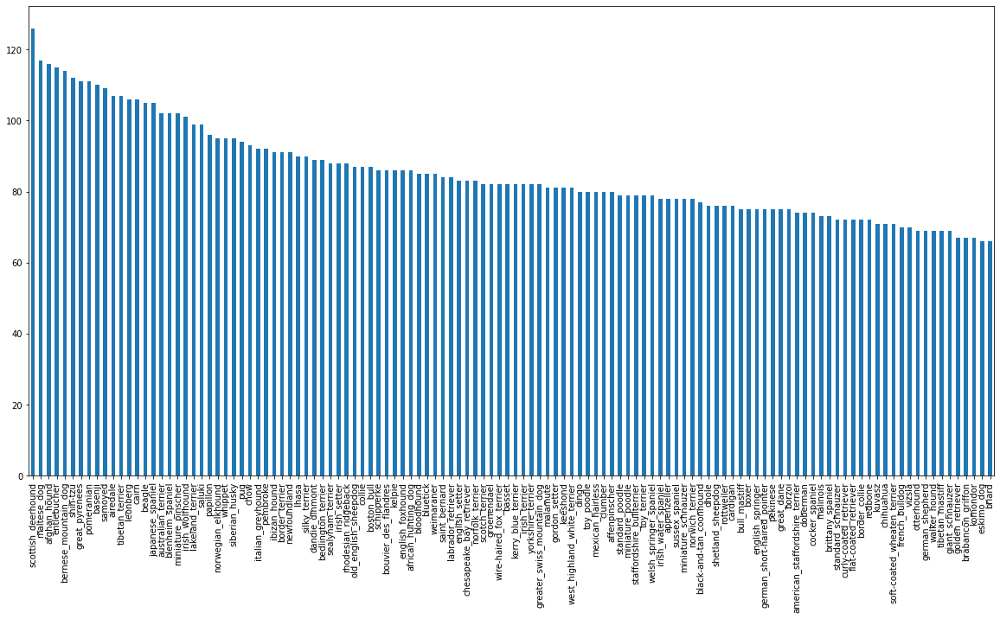

In [3]:
# How many images are there per breed?
labels_csv["breed"].value_counts().plot.bar(figsize= (20 ,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

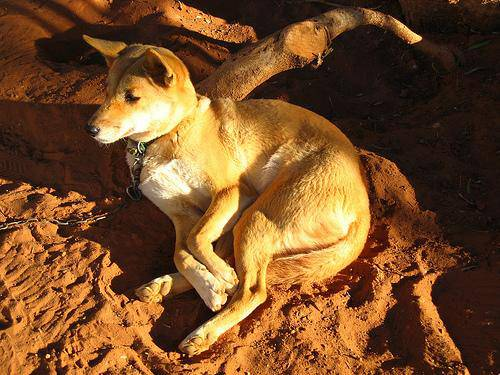

In [ ]:
# Lets view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Lets get a list of all image file pathnames.

In [4]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]


['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [5]:
# Check whether number of filenames matches number of actual image files
import os 
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed!!")
else:
  print("Check the target directory.")

Filenames match actual amount of files!!! Proceed!!


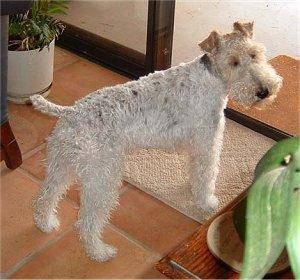

In [ ]:
Image(filenames[7000])

In [6]:
import numpy as np
labels_csv["breed"][7000]

'wire-haired_fox_terrier'

Since we have now got our training images in a list, let's prepare our labels

In [7]:
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [8]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number if labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames


In [9]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [10]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [11]:
# Example: Turning boolean array into integers#
print(labels[0])# original label
print(np.where(unique_breeds == labels[0]))# index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

In [12]:
# Setup X and y variables
X = filenames
y = boolean_labels

We are going to start off by experimenting with less than 1000 images and increase as needed

In [13]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1, max:1000, step:1}

In [14]:
# lets split our data into train and validation sets
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size= 0.2,
                                                  random_state = 42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we are going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return modified `image`

In [15]:
# Convert an image to a numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [16]:
# turn an image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [17]:
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes a image file path and turns the image into a Tensor.
  """

  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with 3 colour channels (red, green, blue)
  image = tf.image.decode_jpeg(image, channels =3)

  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you are trying to process in one go... they might not fit into the memory.

So that is why we do about 32 ( batch size ) images at a time.

We need our data in form of Tensor tuples which look like this:
`(image, label)`

In [18]:
# Creat a simple function to return a tuple (image, label)
def get_image_label(image_path, label):

  image = process_image(image_path)
  return image, label


Now we have got a way to turn our data into tuples of Tensors in the form: `(image, label)` lets make a function to turn the X and y into batches!

In [19]:
# Define the batch size, 32 is the size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels). 
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Create validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image )
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch


In [20]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train )
val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating training data batches...
Create validation data batches...


In [21]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec


((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand, let's visualize the data



In [22]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure 
  plt.figure(figsize= (10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [23]:
# Turn the dataset to a numpy array and use the next() function to get the next batch in the dataset
train_images , train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

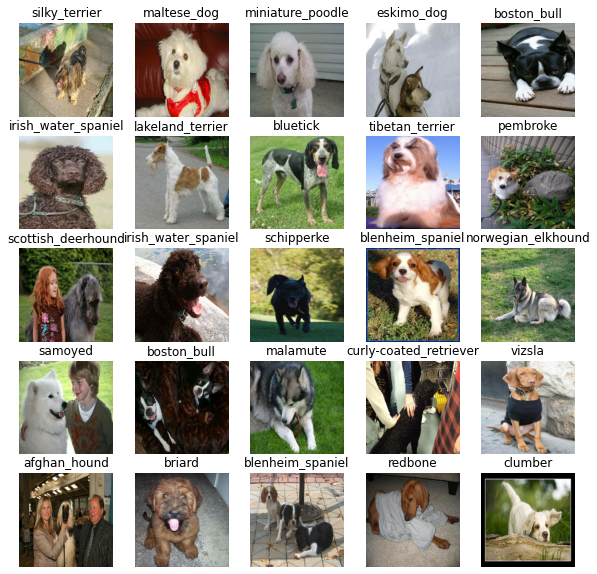

In [24]:
show_25_images(train_images, train_labels)

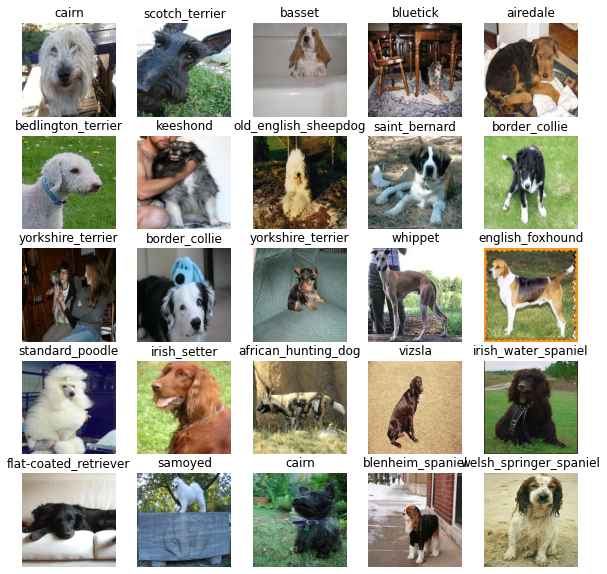

In [25]:
# Now let's visualize our validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our image shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub

In [26]:
# Setup input shape to the model 
INPUT_SHAPE= [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tensorflow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

let's put together our inputs, outputs and model in a deep learning model

My Function:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion ( do this first, then that)
* Compiles the model 
* Builds the model 
* Returns the model.

In [27]:
# Create a function which builds a keras model
def create_model(input_shape= INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url= MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation = "softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model 
  model.build(INPUT_SHAPE)

  return model

In [28]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for tensorboard which helps track our models progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback

1. Load the tensorboard notebook extension 
2. Create a tensorboard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function

In [29]:
# Load tensorboard notebook extension
%load_ext tensorboard

In [30]:
import datetime

# Create a function to build a tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing Tensorboard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs", 
                        # make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [31]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                 patience =3 )

## Training a model (on subset of data)

Our first model is only going to train on 1000 images to make sure everything is working

In [32]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [33]:
# Check to make sure we are still runnnig on a GPU
print("GPU" , "available (YESS!!!)" if tf.config.list_physical_devices("GPU") else "not available:(")

GPU available (YESS!!!)


A function which trains a model

* Create a model using the `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use.
* Return the model

In [34]:
from sklearn.utils import validation
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version
  """

  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq= 1,
            callbacks = [tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [35]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 347s 13s/step - loss: 4.5293 - accuracy: 0.0875 - val_loss: 3.4792 - val_accuracy: 0.1850
Epoch 2/100
25/25 [==============================] - 3s 113ms/step - loss: 1.5976 - accuracy: 0.7038 - val_loss: 2.1987 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 3s 113ms/step - loss: 0.5550 - accuracy: 0.9337 - val_loss: 1.7487 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 3s 118ms/step - loss: 0.2509 - accuracy: 0.9912 - val_loss: 1.5468 - val_accuracy: 0.6000
Epoch 5/100
25/25 [==============================] - 3s 115ms/step - loss: 0.1443 - accuracy: 0.9975 - val_loss: 1.4617 - val_accuracy: 0.6050
Epoch 6/100
25/25 [==============================] - 3s 116ms/step - loss: 0.1000 - accuracy: 0.9987 - val_loss: 1.4137 - val_accuracy: 0.6150
Epoch 7/100
25/25 [=============================

**Note**: Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs

The tensorboard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [36]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [37]:
# Make predictions on the validation data ( not used to train on)
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 1s 93ms/step


array([[8.9896406e-04, 5.0001276e-05, 2.7055633e-03, ..., 3.1278128e-04,
        7.0962692e-06, 3.7973800e-03],
       [1.1394813e-03, 5.8422197e-04, 1.5519340e-02, ..., 7.8031950e-04,
        4.9555616e-04, 9.9324163e-05],
       [1.7119673e-05, 3.5114039e-04, 2.6853491e-05, ..., 4.7520149e-05,
        2.3610326e-05, 2.7146889e-04],
       ...,
       [3.0269018e-06, 3.9363167e-06, 1.1426372e-05, ..., 4.2261377e-06,
        4.2109885e-05, 9.4800353e-06],
       [2.4403261e-03, 8.7812674e-05, 9.5594769e-05, ..., 1.1431228e-04,
        2.6805499e-05, 1.0567938e-02],
       [2.5666261e-04, 6.6662826e-05, 1.3299136e-03, ..., 3.9317557e-03,
        1.4927182e-03, 8.9296220e-05]], dtype=float32)

In [38]:
predictions.shape

(200, 120)

In [39]:
index = 24
print(predictions[index])
print(f"Mav Value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.74043926e-05 1.39139636e-04 2.07397425e-05 1.52482262e-05
 3.47268069e-05 4.93705811e-05 4.07410291e-04 1.13452916e-04
 2.49628210e-04 3.83253791e-05 7.78112098e-06 1.04647386e-03
 2.77835238e-06 3.99014307e-03 3.38051905e-04 9.63424536e-05
 9.45614127e-04 5.86408481e-04 4.83811251e-04 1.69639796e-04
 1.23439522e-05 1.41907258e-05 1.51600407e-05 1.47239434e-05
 1.14150660e-03 9.10562721e-06 5.69036405e-04 3.65460292e-05
 3.17546510e-05 5.03360243e-05 2.37520562e-05 8.59450374e-04
 5.64796627e-02 1.10086624e-03 1.46865405e-05 5.96639329e-05
 2.07179000e-05 1.84642086e-05 1.99087499e-05 4.63272503e-04
 5.21613983e-03 2.50741746e-03 2.25074022e-04 4.64920777e-05
 3.66834320e-05 1.78028076e-05 8.76641861e-05 2.01704272e-04
 1.47406772e-05 4.35148249e-04 3.97046329e-04 2.29088873e-05
 1.08768960e-04 2.29887264e-05 8.11521204e-06 1.12610600e-04
 3.94045562e-03 1.28949221e-04 1.00562954e-03 1.07151305e-03
 2.86627746e-05 7.68114114e-05 3.00546362e-05 2.36310425e-05
 2.97373099e-05 4.139339

Having the above funcitonality is great but we want to do it on scale and see the image the prediction we made on

**Note:** Prediction probabilities are also known as confidence levels

In [40]:
# Turn prediction probability into their respective labels (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probablities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label


'dingo'

In [41]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

We going to unbatch the validation data in order to make predictions on the validation images then compare those predictions to the validation labels.

In [42]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batch dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels= []

  # Loop through the unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [43]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)
  
  print(image)
  print(label)

Streaming output truncated to the last 5000 lines.

 [[0.25513488 0.2201559  0.19254734]
  [0.25818455 0.22320555 0.19559701]
  [0.28897905 0.25400007 0.22639151]
  ...
  [0.1393125  0.11606315 0.06900433]
  [0.12893534 0.11324905 0.06619023]
  [0.1432429  0.12755662 0.08441938]]

 ...

 [[0.3310362  0.49429712 0.192543  ]
  [0.33433145 0.47802895 0.20559186]
  [0.30533677 0.42943233 0.1872521 ]
  ...
  [0.46766642 0.56528556 0.3105236 ]
  [0.46012917 0.5464037  0.29220206]
  [0.43060845 0.51802564 0.25969562]]

 [[0.23758024 0.40422344 0.09904134]
  [0.29779172 0.44837025 0.16837995]
  [0.34402    0.46993035 0.22217126]
  ...
  [0.4661402  0.56106675 0.314582  ]
  [0.47245407 0.5587286  0.3078179 ]
  [0.44306177 0.5293363  0.27553126]]

 [[0.2004445  0.37246928 0.06589444]
  [0.26245335 0.41708085 0.13304158]
  [0.34722233 0.47338593 0.21853644]
  ...
  [0.43430075 0.52813834 0.28500107]
  [0.4386964  0.5249709  0.2753912 ]
  [0.43219256 0.51846707 0.26725814]]]
[False False False Fal

In [ ]:
images_[0],  labels_[0]

In [44]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we have got ways to get:
* Prediction labels
* Validation labels
* Validation images

Let's make some function to make these all a bit more visual

We'll create a function which:
* Takes an array of prediciton probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [45]:

def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change the plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob) * 100,
                                    true_label), color = color)

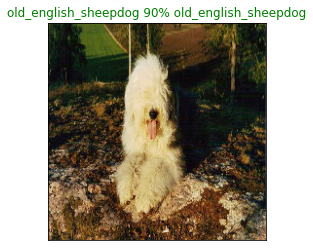

In [46]:
plot_pred(prediction_probabilities = predictions, labels = val_labels,
          images = val_images, n =7)

Now we have one function to visualize our models top prediction, let's make another to view our models top 10 predictions

This function will:
* Take an input of prediction probabilitiees array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, colouring the true label green


In [47]:
def plot_pred_conf(prediction_probabilities, labels, n =1):
  """
  Plus the top 10 highest prediction confidences along with teh truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 predictions confidences indexes
  top_10_pred_indexes  = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")
  
  # Change the color of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

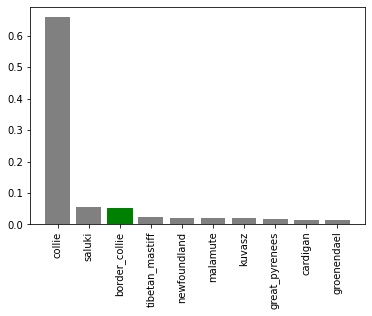

In [48]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n =9)

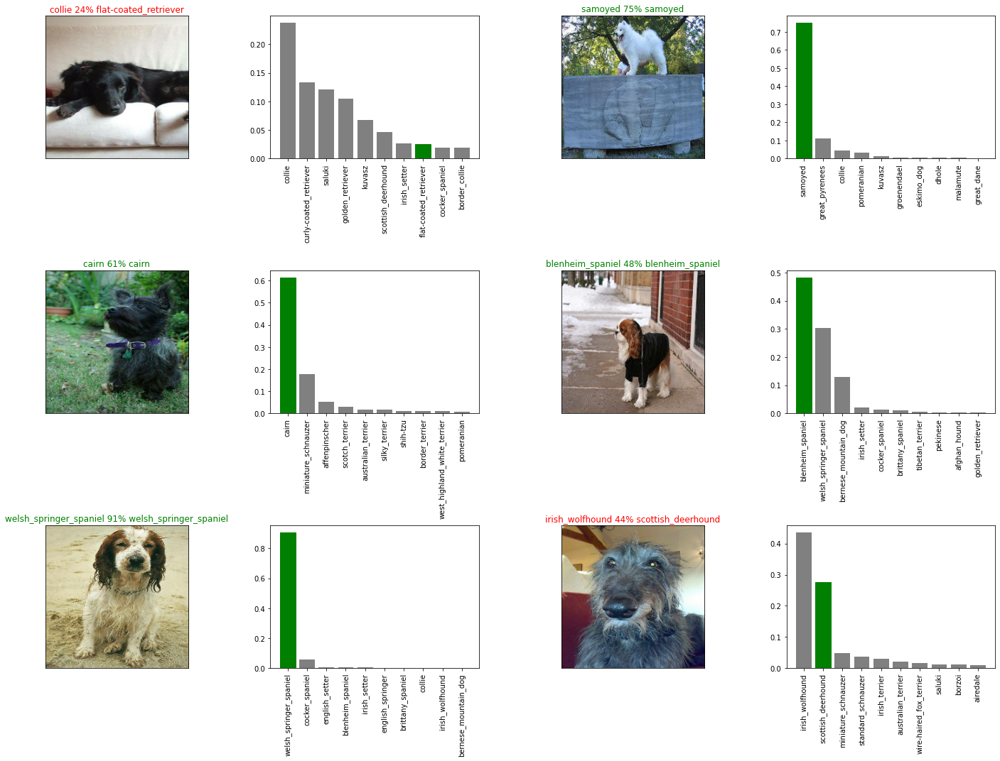

In [49]:
# Let's check out a few predictions and their difference values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize = (10 * num_cols, 5* num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 *i + 1)
  plot_pred(prediction_probabilities=predictions,
            labels = val_labels,
            images= val_images,
            n = i + i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions, 
                 labels = val_labels,
                 n = i + i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

**Challenge:** : Create a confusion matrix with outh models predictions and true labels

## Saving and loading a trained model

In [ ]:
# Creata a function to save a model
def save_model(model, suffix = None):
  """
  Saves a given model in a models directory and appends a suffix (String)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  
  model_path = modeldir + "-" + suffix + ".h5" # Save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path


In [50]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading a saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer})
  
  return model

Testing the saving and loading functions

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix = "1000-images-mobilenetv2-Adam")

In [51]:
# Load a trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/Dog Vision/models/20230127-06181674800316-1000-images-mobilenetv2-Adam.h5")

Loading a saved model from: /content/drive/MyDrive/Dog Vision/models/20230127-06181674800316-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 81ms/step - loss: 1.2820 - accuracy: 0.6500


[1.2820096015930176, 0.6499999761581421]

In [52]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 88ms/step - loss: 1.2629 - accuracy: 0.7150


[1.2628638744354248, 0.7149999737739563]

## Training on full dataset

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch 
full_data= create_data_batches(X, y)

Creating training data batches...


In [ ]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on full data
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience =  3)

In [ ]:
# Fit the full model on full data 
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1000s 3s/step - loss: 1.3164 - accuracy: 0.6772
Epoch 2/100
320/320 [==============================] - 30s 93ms/step - loss: 0.4011 - accuracy: 0.8840
Epoch 3/100
320/320 [==============================] - 30s 92ms/step - loss: 0.2383 - accuracy: 0.9327
Epoch 4/100
320/320 [==============================] - 30s 92ms/step - loss: 0.1519 - accuracy: 0.9639
Epoch 5/100
320/320 [==============================] - 30s 93ms/step - loss: 0.1065 - accuracy: 0.9795
Epoch 6/100
320/320 [==============================] - 29s 92ms/step - loss: 0.0785 - accuracy: 0.9863
Epoch 7/100
320/320 [==============================] - 29s 92ms/step - loss: 0.0584 - accuracy: 0.9913
Epoch 8/100
320/320 [==============================] - 29s 92ms/step - loss: 0.0456 - accuracy: 0.9949
Epoch 9/100
320/320 [==============================] - 29s 92ms/step - loss: 0.0378 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 29s 91ms/step - l

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20230130-05011675054865-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230130-05011675054865-full-image-set-mobilenetv2-Adam.h5'

In [53]:
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20230130-05011675054865-full-image-set-mobilenetv2-Adam.h5")

Loading a saved model from: drive/MyDrive/Dog Vision/models/20230130-05011675054865-full-image-set-mobilenetv2-Adam.h5


In [54]:
len(X)


10222

## Making predictions on the test dataset

To make predictions on the test data we have to transform our data into batches.

We have a function `create_data_batches()` which can take a list of filenames as inputs and convert them into Tensor batches

We have 3 steps:
* Get test image filenames.✅
* Convert the filenames to test data batches and setting the `test_data` parameter to `True`.✅
* Make predictions using `predict()`.✅

In [55]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filename = [test_path + fname for fname in os.listdir(test_path)]
test_filename[:10]

['drive/MyDrive/Dog Vision/test/ddc0134def0da0472e55271da8b57c44.jpg',
 'drive/MyDrive/Dog Vision/test/e504cbd0094fc72312087587795be597.jpg',
 'drive/MyDrive/Dog Vision/test/e280f6f772fa8439dcf0957a0e8b8e1d.jpg',
 'drive/MyDrive/Dog Vision/test/e1f4d57ee24b11a0d1a24b83e12d6bb7.jpg',
 'drive/MyDrive/Dog Vision/test/e383a31009f0779536d43816c10bf662.jpg',
 'drive/MyDrive/Dog Vision/test/df645ae75554d4d7130bfa1b72be53ce.jpg',
 'drive/MyDrive/Dog Vision/test/e2f853c8345758faf5d9b2075f196fd3.jpg',
 'drive/MyDrive/Dog Vision/test/df69bb4b3dbdc81541e2bd70a5f35cb1.jpg',
 'drive/MyDrive/Dog Vision/test/df2a003a0b1a216effd806f03f703859.jpg',
 'drive/MyDrive/Dog Vision/test/ddbb53bb7ea7060847a0bd4554877e80.jpg']

In [56]:
len(test_filename)

10357

In [57]:
# Create test data batch
test_data = create_data_batches(test_filename, test_data = True)

Creating test data batches...


In [58]:
test_data


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [59]:
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 3508s 11s/step


In [60]:
# Save the predictions to a csv for acess later
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter = ",")

In [61]:
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter = ",")
test_predictions[:10]

array([[7.82576018e-11, 1.44578064e-06, 2.20862995e-10, ...,
        1.48780019e-08, 1.18555113e-06, 8.81608386e-09],
       [2.56555222e-06, 3.45605677e-08, 4.51196058e-08, ...,
        5.09762117e-07, 8.76664341e-09, 3.26040754e-06],
       [4.02901756e-09, 5.10767029e-09, 1.80491185e-07, ...,
        4.86903451e-09, 2.23883720e-08, 8.80079227e-08],
       ...,
       [3.53276158e-10, 2.76687614e-12, 1.21056179e-10, ...,
        2.91359076e-10, 8.04027470e-11, 1.78582392e-11],
       [4.02012972e-11, 1.41298151e-05, 1.12714435e-10, ...,
        1.07984777e-09, 6.09398729e-12, 2.43681620e-11],
       [4.08047597e-12, 6.35856038e-12, 2.99363534e-09, ...,
        3.69670147e-06, 5.43360690e-10, 2.35808983e-10]])

## Preparing test dataset predictions for Kaggle

to get the data in the required format, we'll:
* Create a pandas DF with an ID column as well as column for each dog breed
* Add data to the Id column by extracting the test image Id's from their dog breed column.
* Add data to each of the dog breed columns 
* Export the DataFrame as a csv file to Kaggle.

In [62]:
# Create a pandas Df with empty columns
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [64]:
# Append test image IDs to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [66]:
# Add the predictions probablities to each dog breed column
preds_df[list(unique_breeds)] =  test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ddc0134def0da0472e55271da8b57c44,7.825760e-11,1.445781e-06,2.208630e-10,3.955610e-09,5.305271e-12,4.450666e-11,3.369620e-11,9.477704e-10,3.328486e-13,...,3.625878e-09,2.660465e-10,2.482465e-12,6.777205e-11,7.634186e-12,5.548628e-11,4.776837e-10,1.487800e-08,1.185551e-06,8.816084e-09
1,e504cbd0094fc72312087587795be597,2.565552e-06,3.456057e-08,4.511961e-08,5.408221e-12,3.997236e-07,2.032727e-11,1.647055e-06,1.075580e-07,1.893309e-07,...,7.767905e-03,4.102997e-07,8.564855e-09,4.999372e-07,4.675931e-07,1.154301e-10,8.017902e-03,5.097621e-07,8.766643e-09,3.260408e-06
2,e280f6f772fa8439dcf0957a0e8b8e1d,4.029018e-09,5.107670e-09,1.804912e-07,1.028835e-09,6.228745e-08,1.248311e-07,6.941629e-09,7.424908e-07,6.369942e-11,...,2.308486e-09,1.210735e-08,1.020305e-10,1.809771e-07,1.485644e-07,3.263323e-08,9.867429e-07,4.869035e-09,2.238837e-08,8.800792e-08
3,e1f4d57ee24b11a0d1a24b83e12d6bb7,1.522328e-06,1.881602e-08,3.191502e-06,1.617201e-05,3.785219e-06,1.181740e-08,4.912880e-04,3.051132e-06,4.893167e-06,...,6.878530e-07,2.388788e-06,4.017222e-07,3.510212e-07,1.392757e-08,1.853296e-07,9.625290e-04,6.452549e-07,1.613390e-03,4.528254e-06
4,e383a31009f0779536d43816c10bf662,8.233629e-09,3.393730e-09,4.899522e-10,4.161003e-10,1.794457e-08,7.212336e-11,1.221558e-07,2.644800e-09,6.980753e-08,...,3.666438e-01,7.584177e-07,1.617213e-07,4.402244e-10,2.607972e-08,8.830775e-11,4.246553e-06,3.357252e-09,4.564458e-08,3.071230e-07


In [67]:
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index =False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images we will set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images. 

In [69]:
# Get the custom image file paths
custom_path = "drive/MyDrive/Dog Vision/custom-photos/"
custom_images_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_images_paths, test_data=True)

In [ ]:
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
# Get custom images prediction labels
custom_preds_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels

In [ ]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom image predictions
plt.figure(figsize = (10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+i)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_labels[i])
  plt.imshow(image)